In [1]:
import cv2
import sys
import random
import os
import numpy as np
from matplotlib import pyplot as plt
from glob import glob
import tensorflow as tf
from tensorflow.python.ops import nn_ops
from tensorflow.python.ops import math_ops
import time
from nltk.tokenize import RegexpTokenizer
import operator


/home/ziweihe/anaconda2/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
DATA_PATH = "/home/ziweihe/sdb1/cvdata/"
OUTPUT_PATH = "/home/ziweihe/sdb1/cvdata/imgs-halfhalf/"
# CROPPED_PATH = "/home/will/sdb1/cvdata/imgs-halfhalf10/"
CROPPED_PATH = "/home/ziweihe/sdb1/cvdata/wikipages500_3/"
STORE_PATH = "/home/ziweihe/sdb1/"

In [3]:
def png2jpg(inf):
    '''convert pngs in path to jpg'''
    if os.path.isfile(inf) and inf[-3:] is "png":
        # if img is file
        img = cv2.imread(inf)
        cv2.imwrite(OUTPUT_PATH + inf.split('/')[-1][:-3] + 'jpg', img)
    elif os.path.isdir(inf):
        pngs = glob(inf+'/*.png')
        for j in pngs:
            print("processing " + j)
            img = cv2.imread(j)
            cv2.imwrite(OUTPUT_PATH + j.split('/')[-1][:-3] + 'jpg', img)

In [4]:
def crop10(img, h, w):
    '''crop 10 random sub images from original with (h, w) size'''
    sub_imgs = []
    num_imgs = 10
    oh, ow, _ = img.shape
    if w > ow or h > oh:
        return sub_imgs
    for i in range(num_imgs):
        # get the size of the sub-image
        sh = random.randint(1, oh-h)
        sw = random.randint(1, ow-w)
        temp = img[sh:sh+h, sw:sw+w]
        sub_imgs.append(temp)
        
    return sub_imgs

In [5]:
def print_progress(iteration, total, prefix='PROG', suffix='',
                   decimals=1, length=25, fill='>'):
    percent = ("{0:." +
               str(decimals) + "f}").format(100 * (iteration / float(total)))
    filledLength = int(length * iteration // total)
    bar = fill * filledLength + '-' * (length - filledLength)
    sys.stdout.write('\r[%s] %s: |%s| %s%% %s' % (str(datetime.now().strftime("%y%m%d-%H%M%S")),
                                                prefix, bar, percent, suffix))
    # Print New Line on Complete
    if iteration == total:
        print("")

In [6]:
net_data = np.load(open(DATA_PATH + "bvlc_alexnet.npy", "rb"), encoding="latin1").item()

In [7]:
train_x = np.zeros((1, 227,227,3)).astype(np.float32)
train_y = np.zeros((1, 1000))
xdim = train_x.shape[1:]
ydim = train_y.shape[1]

In [8]:
def conv(input, kernel, biases, k_h, k_w, c_o, s_h, s_w,  padding="VALID", group=1):
    '''From https://github.com/ethereon/caffe-tensorflow
    '''
    c_i = input.get_shape()[-1]
    assert c_i%group==0
    assert c_o%group==0
    convolve = lambda i, k: tf.nn.conv2d(i, k, [1, s_h, s_w, 1], padding=padding)
    
    
    if group==1:
        conv = convolve(input, kernel)
    else:
        #tf.split(value, num_or_size_splits, axis) -- new version
        ## tf.split(axis, num_or_size_splits, value) -- old version
        
        #input_groups = tf.split(3, group, input)
        #kernel_groups = tf.split(3, group, kernel)
        
        input_groups = tf.split(input, group, 3)
        kernel_groups = tf.split(kernel, group, 3)
        
        output_groups = [convolve(i, k) for i,k in zip(input_groups, kernel_groups)]
        conv = tf.concat( output_groups, 3)
    return  tf.reshape(tf.nn.bias_add(conv, biases), [-1]+conv.get_shape().as_list()[1:])



x = tf.placeholder(tf.float32, (None,) + xdim)

In [9]:
k_h = 11; k_w = 11; c_o = 96; s_h = 4; s_w = 4
conv1W = tf.Variable(net_data["conv1"][0])
conv1b = tf.Variable(net_data["conv1"][1])
conv1_in = conv(x, conv1W, conv1b, k_h, k_w, c_o, s_h, s_w, padding="SAME", group=1)
conv1 = tf.nn.relu(conv1_in)

#lrn1
#lrn(2, 2e-05, 0.75, name='norm1')
radius = 2; alpha = 2e-05; beta = 0.75; bias = 1.0
lrn1 = tf.nn.local_response_normalization(conv1,
                                                  depth_radius=radius,
                                                  alpha=alpha,
                                                  beta=beta,
                                                  bias=bias)

#maxpool1
#max_pool(3, 3, 2, 2, padding='VALID', name='pool1')
k_h = 3; k_w = 3; s_h = 2; s_w = 2; padding = 'VALID'
maxpool1 = tf.nn.max_pool(lrn1, ksize=[1, k_h, k_w, 1], strides=[1, s_h, s_w, 1], padding=padding)


#conv2
#conv(5, 5, 256, 1, 1, group=2, name='conv2')
k_h = 5; k_w = 5; c_o = 256; s_h = 1; s_w = 1; group = 2
conv2W = tf.Variable(net_data["conv2"][0])
conv2b = tf.Variable(net_data["conv2"][1])
conv2_in = conv(maxpool1, conv2W, conv2b, k_h, k_w, c_o, s_h, s_w, padding="SAME", group=group)
conv2 = tf.nn.relu(conv2_in)


#lrn2
#lrn(2, 2e-05, 0.75, name='norm2')
radius = 2; alpha = 2e-05; beta = 0.75; bias = 1.0
lrn2 = tf.nn.local_response_normalization(conv2,
                                                  depth_radius=radius,
                                                  alpha=alpha,
                                                  beta=beta,
                                                  bias=bias)

#maxpool2
#max_pool(3, 3, 2, 2, padding='VALID', name='pool2')                                                  
k_h = 3; k_w = 3; s_h = 2; s_w = 2; padding = 'VALID'
maxpool2 = tf.nn.max_pool(lrn2, ksize=[1, k_h, k_w, 1], strides=[1, s_h, s_w, 1], padding=padding)

#conv3
#conv(3, 3, 384, 1, 1, name='conv3')
k_h = 3; k_w = 3; c_o = 384; s_h = 1; s_w = 1; group = 1
conv3W = tf.Variable(net_data["conv3"][0])
conv3b = tf.Variable(net_data["conv3"][1])
conv3_in = conv(maxpool2, conv3W, conv3b, k_h, k_w, c_o, s_h, s_w, padding="SAME", group=group)
conv3 = tf.nn.relu(conv3_in)

#conv4
#conv(3, 3, 384, 1, 1, group=2, name='conv4')
k_h = 3; k_w = 3; c_o = 384; s_h = 1; s_w = 1; group = 2
conv4W = tf.Variable(net_data["conv4"][0])
conv4b = tf.Variable(net_data["conv4"][1])
conv4_in = conv(conv3, conv4W, conv4b, k_h, k_w, c_o, s_h, s_w, padding="SAME", group=group)
conv4 = tf.nn.relu(conv4_in)


#conv5
#conv(3, 3, 256, 1, 1, group=2, name='conv5')
k_h = 3; k_w = 3; c_o = 256; s_h = 1; s_w = 1; group = 2
conv5W = tf.Variable(net_data["conv5"][0])
conv5b = tf.Variable(net_data["conv5"][1])
conv5_in = conv(conv4, conv5W, conv5b, k_h, k_w, c_o, s_h, s_w, padding="SAME", group=group)

conv5 = tf.nn.relu(conv5_in)

#maxpool5
#max_pool(3, 3, 2, 2, padding='VALID', name='pool5')
k_h = 3; k_w = 3; s_h = 2; s_w = 2; padding = 'VALID'
maxpool5 = tf.nn.max_pool(conv5, ksize=[1, k_h, k_w, 1], strides=[1, s_h, s_w, 1], padding=padding)

#fc6
#fc(4096, name='fc6')
fc6W = tf.Variable(net_data["fc6"][0])
fc6b = tf.Variable(net_data["fc6"][1])

#fc6 before relu
fc6_before_relu = nn_ops.bias_add( math_ops.matmul(tf.reshape(maxpool5, [-1, int(np.prod(maxpool5.get_shape()[1:]))]), fc6W)   ,fc6b)

fc6 = tf.nn.relu_layer(tf.reshape(maxpool5, [-1, int(np.prod(maxpool5.get_shape()[1:]))]), fc6W, fc6b)

#fc7
#fc(4096, name='fc7')
fc7W = tf.Variable(net_data["fc7"][0])
fc7b = tf.Variable(net_data["fc7"][1])
fc7 = tf.nn.relu_layer(fc6, fc7W, fc7b)

fc7_xw_plus_b = nn_ops.bias_add(math_ops.matmul(fc6, fc7W), fc7b)


fc7_after_relu = nn_ops.relu(fc7_xw_plus_b)


#fc8
#fc(1000, relu=False, name='fc8')
fc8W = tf.Variable(net_data["fc8"][0])
fc8b = tf.Variable(net_data["fc8"][1])
fc8 = tf.nn.xw_plus_b(fc7, fc8W, fc8b)


#prob
#softmax(name='prob'))
prob = tf.nn.softmax(fc8)

#init = tf.initialize_all_variables()
init = tf.global_variables_initializer()
sess = tf.Session()
sess.run(init)

t = time.time()

In [10]:
import PIL
from PIL import Image
import skimage

In [11]:
# Crop images
# h = 227
# w = 227
# count = 0
# total = len(os.listdir(OUTPUT_PATH))
# for item in os.listdir(OUTPUT_PATH):
#     count += 1
#     img_path = OUTPUT_PATH + item
#     img = cv2.imread(img_path)
#     imgs10 = crop10(img, h, w)
#     print(count)
#     if len(imgs10) is not 10:
#         continue
#     for i in range(10):
#         cv2.imwrite(CROPPED_PATH + item[:-4]+ "-part" + str(i) + ".jpg", imgs10[i])

In [12]:
datasize =500 * 3
image_list = []
raw_image_list = []
file_list = []

count = 0
for item in sorted(os.listdir(CROPPED_PATH)):
    count += 1
    if datasize < count:
        break
    print "reading " + CROPPED_PATH + item
    im = cv2.imread(CROPPED_PATH + item)
    raw_image_list.append(im)
    im = (im).astype(np.float32)
    im = im - np.mean(im)
    im[:, :, 0], im[:, :, 2] = im[:, :, 2], im[:, :, 0]
    image_list.append(im)
    file_list.append(item)

reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-0-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-1-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-10-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-100-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-101-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-102-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-103-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-104-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-105-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-106-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-107-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-108-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-109-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-11-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-110-wiki.jpg
reading /home/ziweihe/sdb1/cvda

reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-274-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-275-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-276-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-277-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-278-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-279-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-28-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-280-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-281-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-282-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-283-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-284-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-285-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-286-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-287-wiki.jpg
reading /home/ziweihe/sdb1

reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-443-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-444-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-445-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-446-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-447-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-448-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-449-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-45-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-450-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-451-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-452-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-453-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-454-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-455-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/en-456-wiki.jpg
reading /home/ziweihe/sdb1

reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-163-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-164-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-165-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-166-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-167-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-168-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-169-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-17-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-170-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-171-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-172-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-173-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-174-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-175-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-176-wiki.jpg
reading /home/ziweihe/sdb1

reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-334-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-335-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-336-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-337-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-338-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-339-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-34-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-340-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-341-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-342-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-343-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-344-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-345-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-346-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-347-wiki.jpg
reading /home/ziweihe/sdb1

reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-55-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-56-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-57-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-58-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-59-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-6-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-60-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-61-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-62-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-63-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-64-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-65-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-66-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-67-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/ru-68-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipag

reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-221-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-222-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-223-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-224-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-225-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-226-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-227-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-228-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-229-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-23-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-230-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-231-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-232-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-233-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-234-wiki.jpg
reading /home/ziweihe/sdb1

reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-384-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-385-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-386-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-387-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-388-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-389-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-39-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-390-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-391-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-392-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-393-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-394-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-395-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-396-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-397-wiki.jpg
reading /home/ziweihe/sdb1

reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-97-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-98-wiki.jpg
reading /home/ziweihe/sdb1/cvdata/wikipages500_3/zh-99-wiki.jpg


In [13]:
print(len(image_list))

1500


In [14]:
im_fc7 = sess.run(fc7_xw_plus_b, feed_dict = {x:image_list})
im_fc7 = np.array(im_fc7)

im_fc6 = sess.run(fc6_before_relu, feed_dict = {x:image_list})
im_fc6 = np.array(im_fc6)

im_conv5 = sess.run(conv5_in, feed_dict = {x:image_list})
im_conv5 = np.array(im_conv5)

In [15]:
dataset = 'wiki-en-zh'

np.save(STORE_PATH + dataset +'_raw_image_list.npy', raw_image_list)
raw_image_list = np.array(raw_image_list)
print(raw_image_list.shape)

np.save(STORE_PATH + dataset + '_image_list.npy', image_list)
image_list = np.array(image_list)
print(image_list.shape)

(1500, 227, 227, 3)
(1500, 227, 227, 3)


In [16]:
np.save(STORE_PATH + dataset + '_fc7.npy', im_fc7)
print(im_fc7.shape)

np.save(STORE_PATH + dataset + '_fc6.npy', im_fc6)
print(im_fc6.shape)

np.save(STORE_PATH + dataset + '_conv5.npy', im_conv5)
print(im_conv5.shape)

(1500, 4096)
(1500, 4096)
(1500, 13, 13, 256)


In [17]:
'''get threshold using 90% percentile'''
percentile_fc7 = np.percentile(im_fc7, 90, axis = 0)
percentile_fc6 = np.percentile(im_fc6, 90, axis = 0)
percentile_conv5 = np.percentile(im_conv5, 90, axis = 0)

In [18]:
np.save(STORE_PATH +  dataset +'_percentile_fc7.npy', percentile_fc7)
np.save(STORE_PATH +  dataset +'_percentile_fc6.npy', percentile_fc6)
np.save(STORE_PATH +  dataset +'_percentile_conv5.npy', percentile_conv5)

percentile_fc7 = np.array(percentile_fc7)
print(percentile_fc7.shape)
percentile_fc6 = np.array(percentile_fc6)
print(percentile_fc6.shape)
percentile_conv5 = np.array(percentile_conv5)
print(percentile_conv5.shape)

(4096,)
(4096,)
(13, 13, 256)


In [19]:
# Topics count (7, 20, 50, 100)
NUM_TOPIC = 3
# Features for Topics
NUM_FEATURE = 4096
# Amount of images being classified
NUM_IMAGE = datasize

In [20]:
X = im_fc7

In [21]:
# Get data statistics, as a sanity check
print("Daxta shape: ", X.shape)
print("Number of 0s: ", np.sum(X == 1))
print("Number of 1s: ", np.sum(X == 0))
print("Anomailes: ",np.sum([X < 0]))


('Daxta shape: ', (1500, 4096))
('Number of 0s: ', 0)
('Number of 1s: ', 0)
('Anomailes: ', 5482029)


In [22]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from gensim import corpora, models

In [23]:
binary_vector_fc7 = np.greater(im_fc7, percentile_fc7).astype(int)

In [24]:
print("Data shape: ", binary_vector_fc7.shape)
print("Number of 1s: ", np.sum(binary_vector_fc7 == 1))
print("Number of 0s: ", np.sum(binary_vector_fc7 == 0))
print("Anomailes: ",np.sum([binary_vector_fc7 < 0]))


('Data shape: ', (1500, 4096))
('Number of 1s: ', 612133)
('Number of 0s: ', 5531867)
('Anomailes: ', 0)


In [25]:
X = binary_vector_fc7
DATA_PATH = "/home/will/cvdata/workspace/data2/"

In [26]:
# Prepare for corpus
corpus = [[(j, X[i, j]) for j in range(NUM_FEATURE) if X[i, j]==1] for i in range(NUM_IMAGE)]
# corpora.MmCorpus.serialize(DATA_PATH + 'corpus.mm', corpus)

In [27]:
curr_time = str(int(time.time()))
model_name = str(NUM_TOPIC) + '-topics.model'
topics_file_name = 'topic_model_features_' + str(NUM_TOPIC) +'_topics_'+ curr_time + '.npy'
topics_per_image_file_name = 'topics_per_image-' + str(NUM_TOPIC) +'_topics_'+ curr_time + '.npy'
print("Loading model: " + model_name)

Loading model: 3-topics.model


In [28]:
K = NUM_TOPIC
# Create the Topic Model
model_name = str(K) + '-topics.model'
lda = models.ldamodel.LdaModel(corpus, num_topics = K)
# lda.save('data/' + model_name)

# # Get topic for each image
# img_by_topic = [[] for _ in range(K)]
# for i in range(num_images):
#     ind, val = sorted(lda.get_document_topics(corpus[i]), key=lambda x:x[1])[-1]
#     img_by_topic[ind].append((i, val))

# for j in range(K):
#     img_by_topic[j].sort(key = lambda x: -x[1])

    # Save results
#     with open(DATA_PATH + str(K) + "-topic-res.txt", "wb") as fp:
#         pickle.dump(img_by_topic, fp)

# # load trained data
# lda = models.ldamodel.LdaModel.load(DATA_PATH + model_name)
# print(lda)

In [29]:
# Process the raw data
doc = []
bow = []
for i in range(NUM_IMAGE):
    doc_list = []
    bow_list = []
    for j in range(X.shape[1]): # 4096
        doc_list.append((j, X[i,j]))
        bow_list.append(X[i,j])
    doc.append(doc_list)
    bow.append(bow_list)
    

In [30]:
# Raw output for dist
topic_distribution = lda.print_topics(num_words=NUM_FEATURE)


In [31]:
'''Save distribution of features for every topic'''

# Extract feature ids per topic from raw output
topics = np.zeros([NUM_TOPIC, NUM_FEATURE])
tokenizer = RegexpTokenizer(r'\w+')

for topic_ids in topic_distribution:
    topic_id = topic_ids[0]
    all_features = topic_ids[1]

    feature_values = tokenizer.tokenize(all_features)     # Tokenize the string to keep all numbers
    feature_values = list(map(int, feature_values))       # Convert values of list to int
    feature_values = np.asarray(feature_values[2::3]) * np.asarray(feature_values[1::3])   # Remove all features with 0 weightage in topic
    
    topics[topic_id] = feature_values
        
# Save feature values in npy file
# np.save(DATA_PATH + topics_file_name, topics)

#topics is a numpy array with one row representing one topic. The columns contain the indices of the features belonging to that topic, in decreasing order of how strongly linked a feature is to that topic. The vectors have been padded with 0s in the end.

In [32]:
'''Save distribution of topics, for every image'''

# Save top k topics per image to file
k = min(5, NUM_TOPIC)

topics_per_image = lda[doc]
topics_per_image_matrix = np.zeros([len(topics_per_image),k,2])
print ("No of documents: ", len(topics_per_image))

i = 0
topic_dict = {}
for image_topics in topics_per_image:
    image_topics.sort(key=operator.itemgetter(1), reverse=True)
    print ("Image ",file_list[i], " Topics: ", image_topics[0][0])
    if image_topics[0][0] not in topic_dict:
        topic_dict[image_topics[0][0]] = []
    topic_dict[image_topics[0][0]].append(i)
    for j in range(min(k,len(image_topics))):
        topics_per_image_matrix[i][j][0] = image_topics[j][0]    # Store topic id
        topics_per_image_matrix[i][j][1] = image_topics[j][1]    # Store probability of document having that topic
    i = i+1
    
# Save feature values in npy file
# np.save(DATA_PATH + topics_per_image_file_name, topics_per_image_matrix)

('No of documents: ', 1500)
('Image ', 'en-0-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-1-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-10-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-100-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-101-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-102-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-103-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-104-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-105-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-106-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-107-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-108-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-109-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-11-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-110-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-111-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-112-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-113-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-114-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-115-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-116-wiki.jpg', ' Topics: ', 0)
('Image ', '

('Image ', 'en-264-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-265-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-266-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-267-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-268-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-269-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-27-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-270-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-271-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-272-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-273-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-274-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-275-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-276-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-277-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-278-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-279-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-28-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-280-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-281-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-282-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-283-wiki.jpg', ' Topi

('Image ', 'en-429-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-43-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-430-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-431-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-432-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-433-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-434-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-435-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-436-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-437-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-438-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-439-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-44-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-440-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-441-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-442-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-443-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-444-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-445-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-446-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-447-wiki.jpg', ' Topics: ', 0)
('Image ', 'en-448-wiki.jpg', ' Topi

('Image ', 'ru-144-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-145-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-146-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-147-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-148-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-149-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-15-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-150-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-151-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-152-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-153-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-154-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-155-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-156-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-157-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-158-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-159-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-16-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-160-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-161-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-162-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-163-wiki.jpg', ' Topi

('Image ', 'ru-317-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-318-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-319-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-32-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-320-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-321-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-322-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-323-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-324-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-325-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-326-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-327-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-328-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-329-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-33-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-330-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-331-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-332-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-333-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-334-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-335-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-336-wiki.jpg', ' Topi

('Image ', 'ru-497-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-498-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-499-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-5-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-50-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-51-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-52-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-53-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-54-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-55-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-56-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-57-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-58-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-59-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-6-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-60-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-61-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-62-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-63-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-64-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-65-wiki.jpg', ' Topics: ', 0)
('Image ', 'ru-66-wiki.jpg', ' Topics: ', 0)
('Image '

('Image ', 'zh-221-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-222-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-223-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-224-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-225-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-226-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-227-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-228-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-229-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-23-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-230-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-231-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-232-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-233-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-234-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-235-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-236-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-237-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-238-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-239-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-24-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-240-wiki.jpg', ' Topi

('Image ', 'zh-383-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-384-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-385-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-386-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-387-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-388-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-389-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-39-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-390-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-391-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-392-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-393-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-394-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-395-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-396-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-397-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-398-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-399-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-4-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-40-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-400-wiki.jpg', ' Topics: ', 1)
('Image ', 'zh-401-wiki.jpg', ' Topics

In [33]:
print topics_per_image_matrix

[[[0.         0.93371087]
  [2.         0.0635656 ]
  [0.         0.        ]]

 [[0.         0.99402189]
  [0.         0.        ]
  [0.         0.        ]]

 [[0.         0.84589285]
  [2.         0.15156627]
  [0.         0.        ]]

 ...

 [[1.         0.76420736]
  [2.         0.23494086]
  [0.         0.        ]]

 [[1.         0.98138332]
  [2.         0.01631038]
  [0.         0.        ]]

 [[1.         0.75668889]
  [2.         0.24020708]
  [0.         0.        ]]]


In [34]:
# Statistics
t = [0, 0, 0]
for i in range(500):
    t[int(topics_per_image_matrix[i][0][0])] += 1
print "For ENG articles, " + str(t[0]) + " belongs to topic 0"
print ", " + str(t[1]) + " belongs to topic 1"
print ", " + str(t[2]) + " belongs to topic 2"

t = [0, 0, 0]
for i in range(500,1000):
    t[int(topics_per_image_matrix[i][0][0])] += 1
print "For RUS articles, " + str(t[0]) + " belongs to topic 0"
print ", " + str(t[1]) + " belongs to topic 1"
print ", " + str(t[2]) + " belongs to topic 2"

t = [0, 0, 0]
for i in range(1000, 1500):
    t[int(topics_per_image_matrix[i][0][0])] += 1
print "For CHN articles, " + str(t[0]) + " belongs to topic 0"
print ", " + str(t[1]) + " belongs to topic 1"
print ", " + str(t[2]) + " belongs to topic 2"

For ENG articles, 499 belongs to topic 0
, 0 belongs to topic 1
, 1 belongs to topic 2
For RUS articles, 491 belongs to topic 0
, 8 belongs to topic 1
, 1 belongs to topic 2
For CHN articles, 0 belongs to topic 0
, 499 belongs to topic 1
, 1 belongs to topic 2


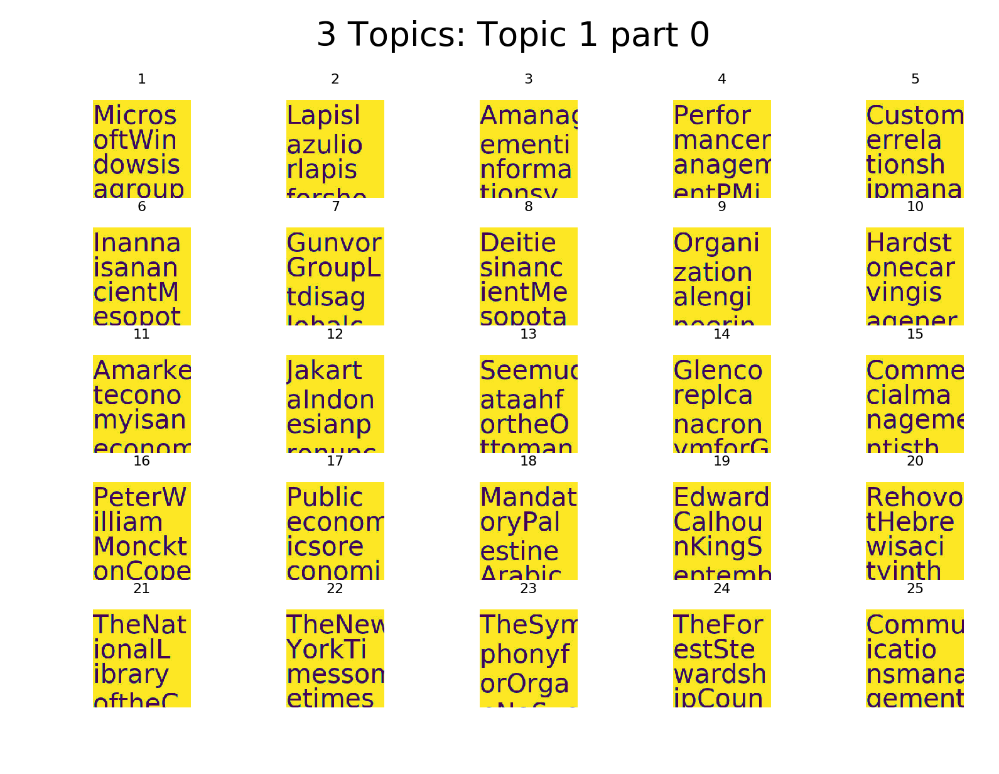

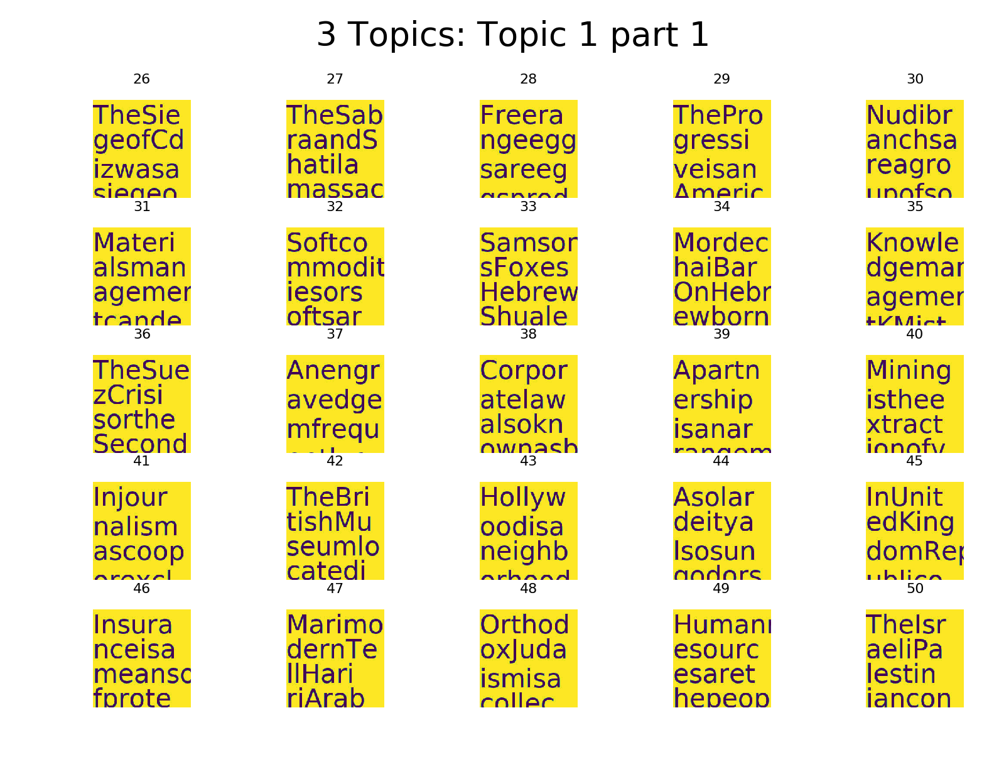

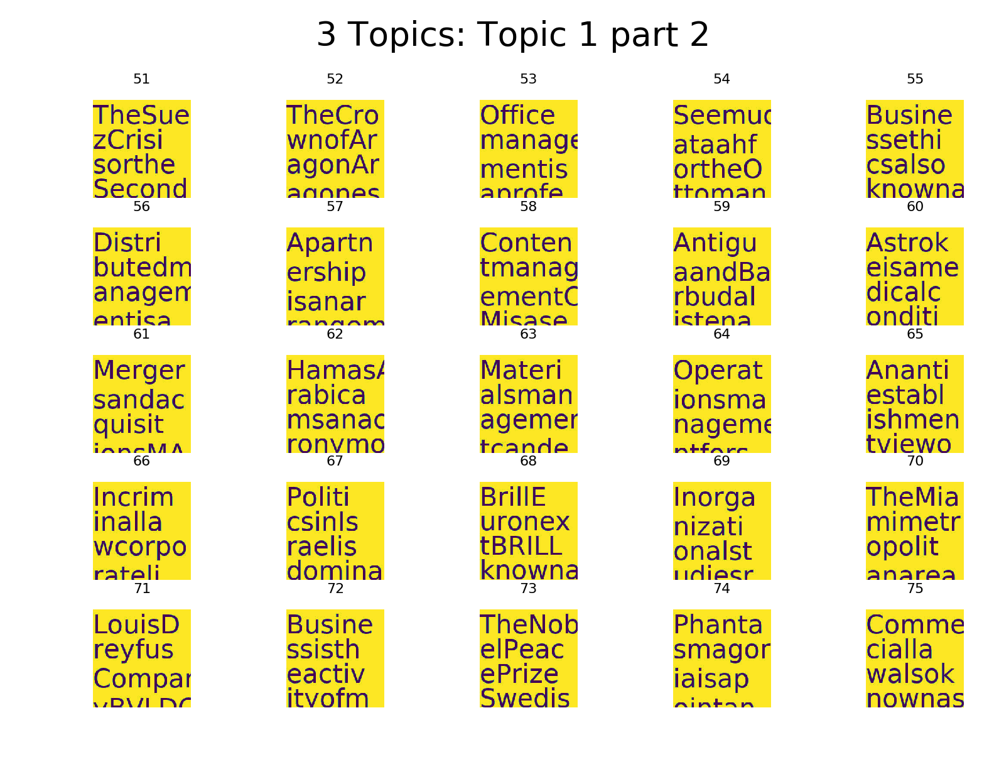

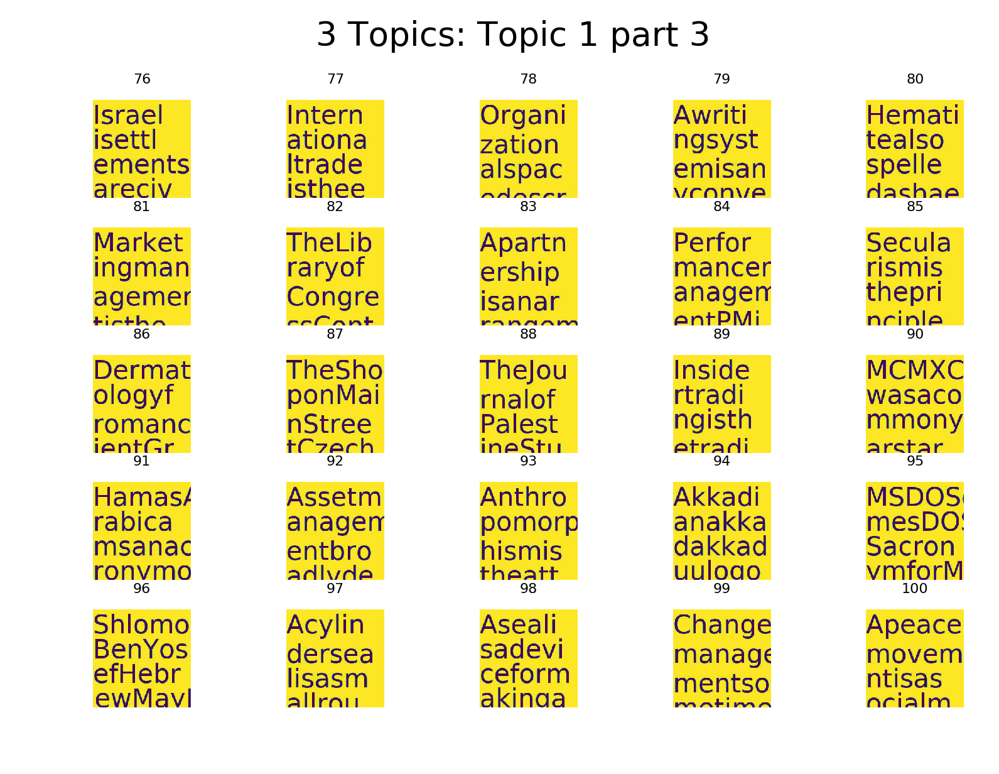

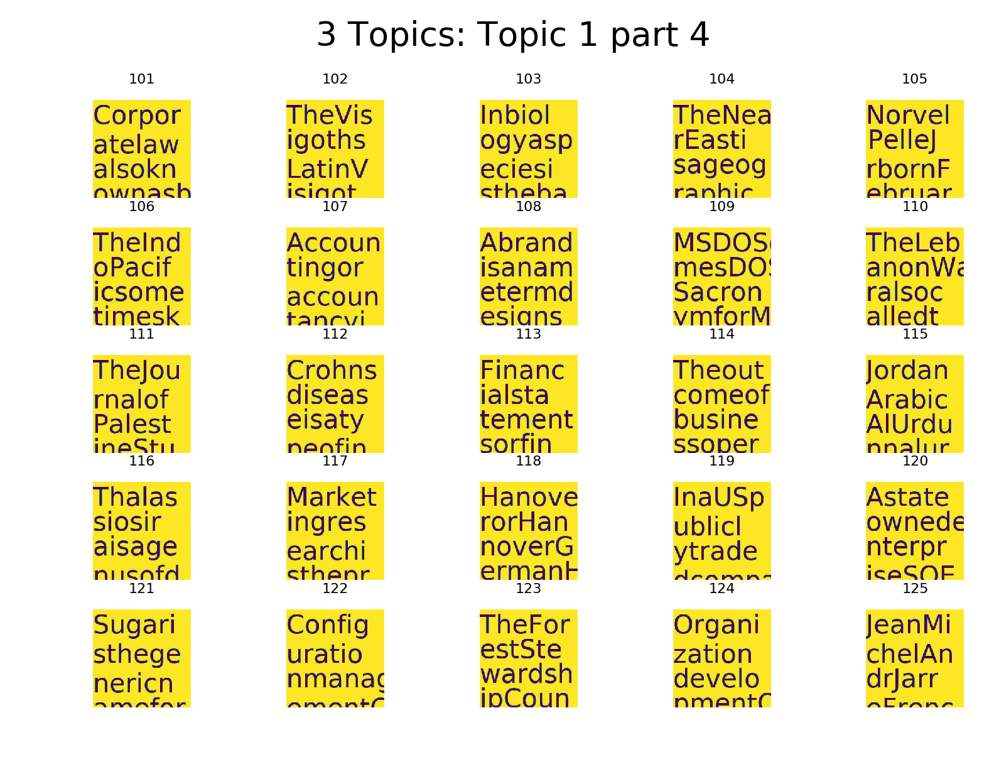

...

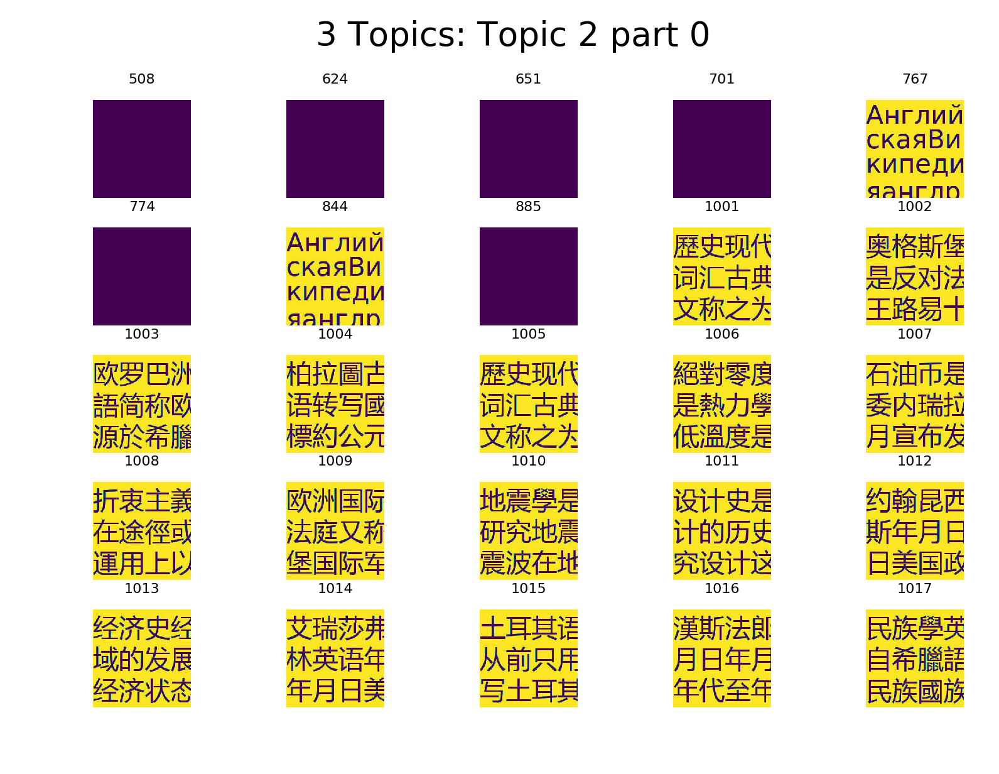

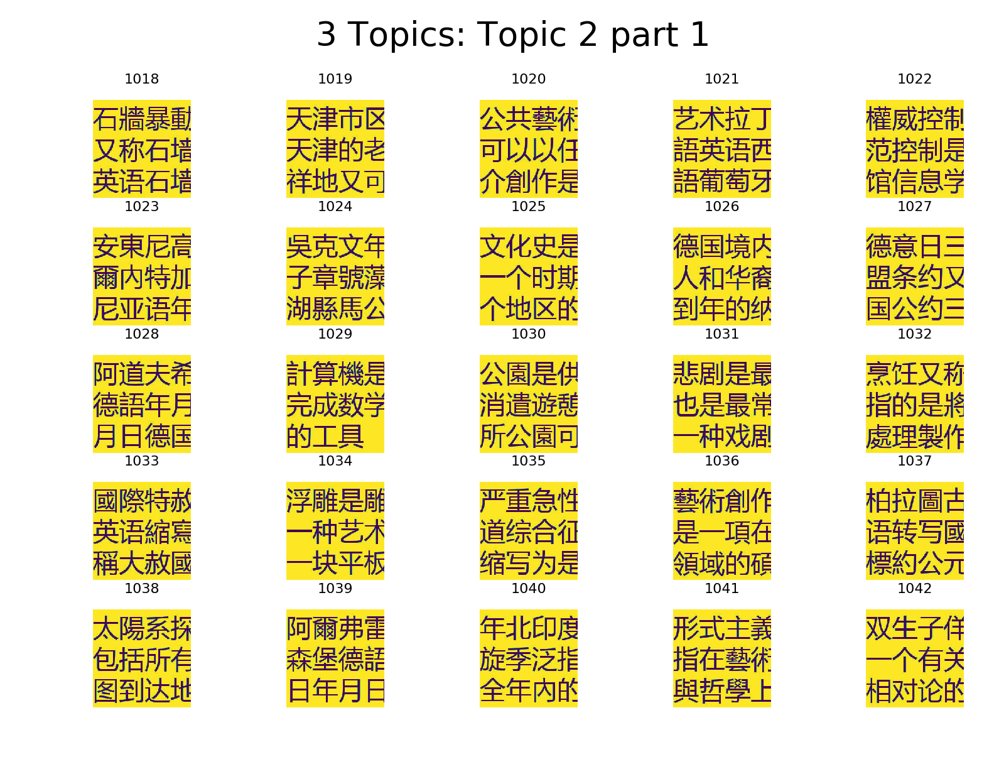

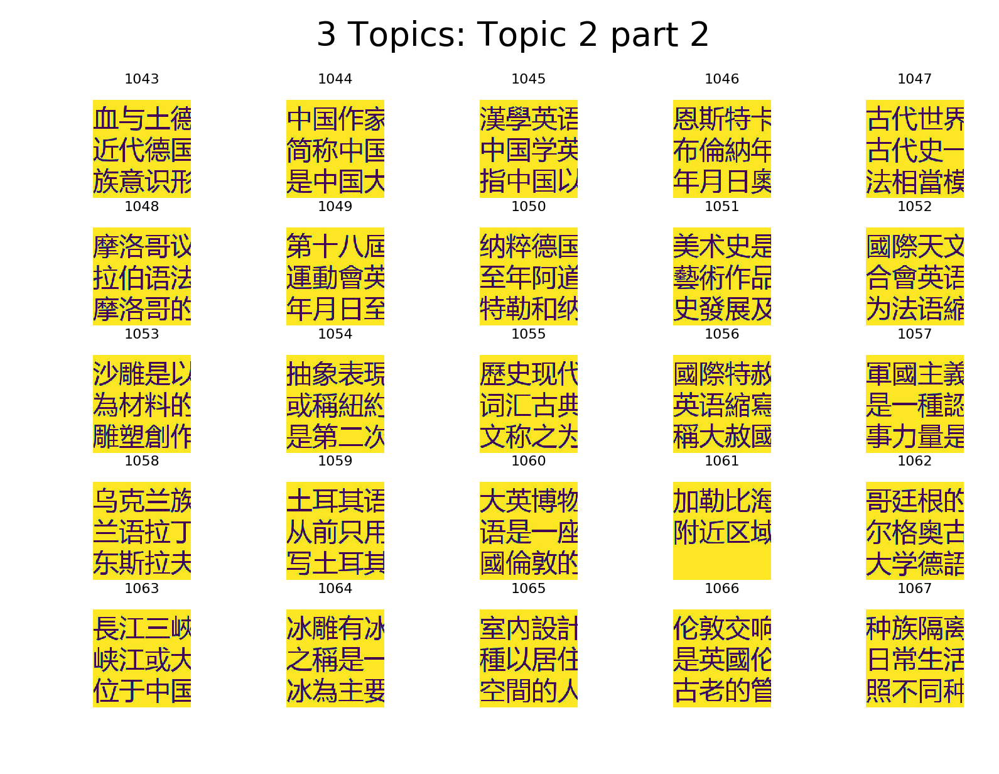

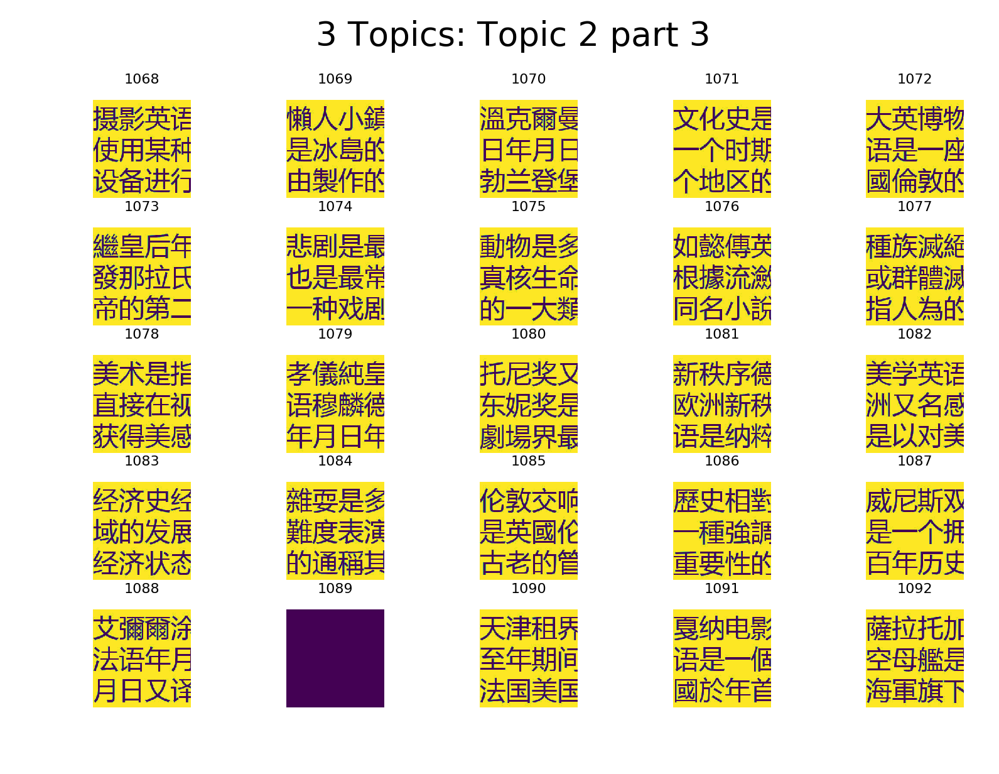

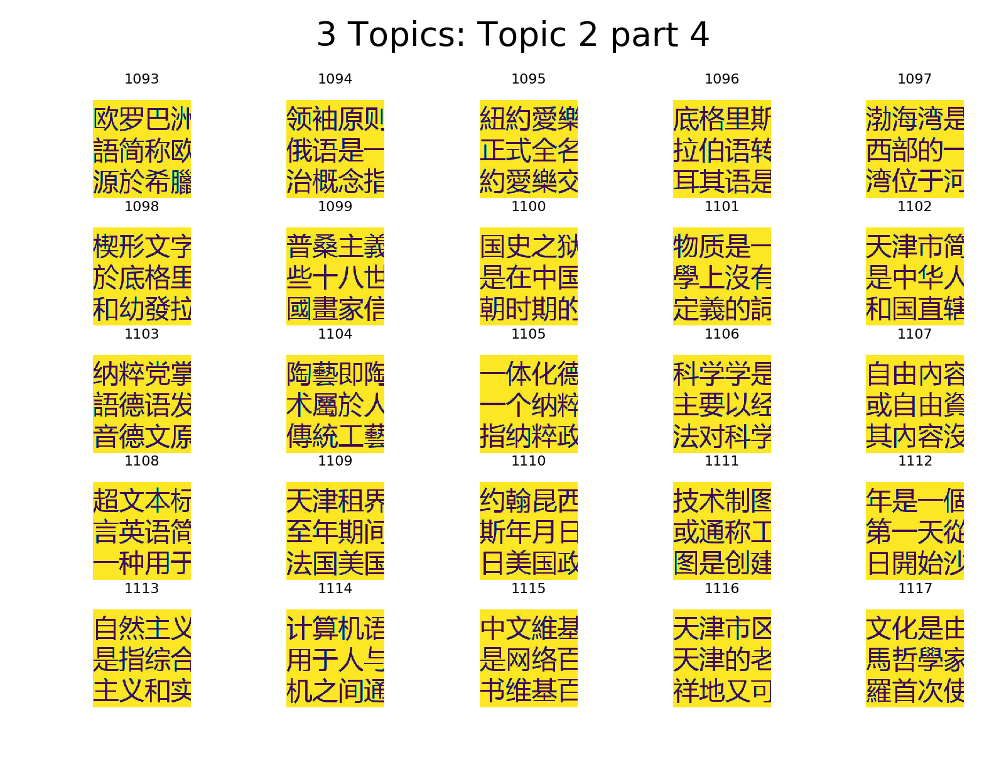

In [ ]:
top_n_list = range(NUM_TOPIC)
num_topics = len(top_n_list)
for topic in top_n_list:
    i = 0
    for j in range(20):
        fig, ax = plt.subplots(nrows=5, ncols=5, dpi=320)
        fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.3)
        fig.suptitle(str(num_topics)+' Topics: Topic '+str(topic+1)+' part '+str(j))
        for row in ax:
            for col in row:
                if i >= len(topics_per_image_matrix): 
                     break
                while int(topics_per_image_matrix[i][0][0]) != topic:
                    i+=1
                    if i == len(topics_per_image_matrix):
                        break
                if i >= len(topics_per_image_matrix):
                     break
                image_path = CROPPED_PATH +file_list[i]
    #             print image_path


                # create a file-like object from the url
                f = open(image_path)
                # read the image from url
                I = plt.imread(f,  format='jpg')
    #             min_dim = min(I.shape[0],I.shape[1])
    #             r = 227.0/min_dim
    #             new_width = I.shape[0]*r
    #             new_height = I.shape[1]*r
    #             I = imresize(I,(int(math.ceil(new_width)),int(math.ceil(new_height)),3))
    #             I = I[0:227,0:227,:3]
                i += 1
                col.axis('off')
                col.set_title(i, fontsize=5)
                col.imshow(I)
    plt.show()     
